# Battle of the Neighborhoods

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

The problem to be discussed in this report is: In what neighborhood of New York City should a restaurant be opened? 
A well-known saying regarding property is “location, location, loction”. This definitely goes for where to open a business, too. Only when you have decided on the state, town and neighborhood of your business, you will be able to start working on the other requirements / steps towards the actual opening.

Since there are lots of restaurants in New York City we will try to detect locations that are not already crowded with restaurants. We are also particularly interested in areas with no Italian restaurants in vicinity. We would also prefer locations as close to city center as possible, assuming that first two conditions are met.

We will use our data science powers to generate a few most promissing neighborhoods based on this criteria. Advantages of each area will then be clearly expressed so that best possible final location can be chosen by stakeholders.

## Data <a name="data"></a>

Based on definition of our problem, factors that will influence our decission are:

    number of existing restaurants in the neighborhood (any type of restaurant)
    number of residents per square kilometer per community district 

I decided to use the Community Districts of New York City to define our neighborhood areas. Community Districts consist of several neighborhoods and are also differentiated by boroughs.

Following data sources will be needed to extract/generate the required information:

    publicly available neighborhood data woith coordinates and borough they belong
    publicly available list of community districts with neighborhoods belonging
    number of restaurants and their type and location in every neighborhood will be obtained using Foursquare API
    



### Neighborhoods of New York City

Let's create a list of all neighborhoods and link them to community boards of NYC

New York City Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood.

Luckily, this dataset exists for free on the web. Here is the link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572


In [2]:
import pandas as pd
import numpy as np

import json # library to handle JSON files
import unicodedata

from bs4 import BeautifulSoup
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

import matplotlib as mpl
import matplotlib.pyplot as plt

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [4]:
neighborhoods_data = newyork_data['features']
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [5]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [6]:
print(neighborhoods.shape)
neighborhoods.head()

(306, 4)


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


Let's add the community boards from each neighborhood

In [7]:
import unicodedata

from bs4 import BeautifulSoup
import requests

In [8]:
src = requests.get('https://en.wikipedia.org/wiki/Neighborhoods_in_New_York_City ').text
soup = BeautifulSoup(src,'lxml')

In [9]:
tbl = soup.find('table') # after inspecting the html we need to get the first table element
tdcoll = tbl.find_all('td') # we need to collect the td elements
cnt = len(tdcoll) # count of elements found
print('Nbr of community boards found:', cnt/5)

Nbr of community boards found: 60.0


In [10]:
#initialize lists
communityboard = []
areaskm = []
pop = []
popskm = []
hoods = []
Borough = []

#populate the lists
for i in range(0, cnt, 5):
    str = unicodedata.normalize("NFKD", tdcoll[i].text.strip())
    communityboard.append(str)
    areaskm.append(tdcoll[i+1].text.strip())
    pop.append(tdcoll[i+2].text.strip())
    popskm.append(tdcoll[i+3].text.strip())
    hoods.append(tdcoll[i+4].text.strip())

In [11]:
df_CB = pd.DataFrame(data=[communityboard, areaskm, pop, popskm, hoods]).transpose()
df_CB.columns = ['CommunityBoard', 'CB_Area', 'CB_Population', 'CB_Pop_skm', 'Neighborhoods']

In [12]:
print(df_CB.shape)
df_CB.head()
df_CB.rename(columns = {'CommunityBoard':'CB'}, inplace = True)

(60, 5)


we see that there are 59 Community Boards. The row for New York City and the footnotes will be deleted.

In [13]:
# cleaning the data
df_CB.iloc[10][2] = df_CB.iloc[10][2].split('[')[0]  # delete footnote
df_CB.iloc[10][4] = df_CB.iloc[10][4].split('[')[0] # delete footnotes
df_CB.drop(df_CB[df_CB['CB'] == 'New York City'].index, inplace=True) # delete New York City total row

In [14]:
print(df_CB.shape)
df_CB.head()

(59, 5)


,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods
0,Bronx CB 1,7.17,"91,497","12,761","Melrose, Mott Haven, Port Morris"
1,Bronx CB 2,5.54,"52,246","9,792","Hunts Point, Longwood"
2,Bronx CB 3,4.07,"79,762","19,598","Claremont, Concourse Village, Crotona Park, Mo..."
3,Bronx CB 4,5.28,"146,441","27,735","Concourse, High Bridge"
4,Bronx CB 5,3.55,"128,200","36,145","Fordham, Morris Heights, Mount Hope, Universit..."


In [15]:
# add community district code to dataframe
tmp = []

for row in df_CB['CB']:
    s = row.split()

    if s[0] == 'Manhattan':
        s[0] = '1'    
    elif s[0] == 'Bronx':
        s[0] = '2'
    elif s[0] == 'Brooklyn':
        s[0] = '3'
    elif s[0] == 'Queens':
        s[0] = '4'
    elif s[0] == 'Staten':
        s[0] = '5'
        s[2] = s[3]
        
    if int(s[2]) < 10:
        s[2] = '0'+s[2]
    tmp.append(s[0]+s[2])

df_CB['boro_cd'] = tmp
df_CB.head()

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd
0,Bronx CB 1,7.17,"91,497","12,761","Melrose, Mott Haven, Port Morris",201
1,Bronx CB 2,5.54,"52,246","9,792","Hunts Point, Longwood",202
2,Bronx CB 3,4.07,"79,762","19,598","Claremont, Concourse Village, Crotona Park, Mo...",203
3,Bronx CB 4,5.28,"146,441","27,735","Concourse, High Bridge",204
4,Bronx CB 5,3.55,"128,200","36,145","Fordham, Morris Heights, Mount Hope, Universit...",205


In [16]:
# Add CB to neighborhoods
# initialize lists
nbh = []
CB = []

#populate the lists
for i in range (0, len(df_CB), 1):
    tmp = df_CB.iloc[i][4].split(', ')
    for j in range (0, len(tmp), 1):
        nbh.append(tmp[j])
        CB.append(df_CB.iloc[i][0])

In [17]:
print('The list contains', len(nbh), 'neighborhoods')

The list contains 326 neighborhoods


326 are more than the 306 in our neighborhood list. Let's see why:

### Cleaning of the data: 

After careful review, 64 Neighborhoods from the Wikipedia Community Boards page are not in the neighborhoods list from the NYC page.

And 44 Neighborhoods are not in the CB list.

Additionally, 8 Neigborhoods are differently spelled. This was corrected for all 8 rows.

The data was cleaned using an Excel table mand is loaded into a new dataframe.

In [18]:
# This csv file was edited in Excel, so we import it again
neighborhoods_CB = pd.read_csv('neighborhoods_CB.csv', index_col=0)

In [19]:
neighborhoods_CB.shape

(262, 5)

In [20]:
neighborhoods_CB.head()

,Borough,CB,Neighborhood,Latitude,Longitude
1,Bronx,Bronx CB 1,Melrose,40.819754,-73.909422
2,Bronx,Bronx CB 1,Mott Haven,40.806239,-73.916100
3,Bronx,Bronx CB 1,Port Morris,40.801664,-73.913221
4,Bronx,Bronx CB 10,City Island,40.847247,-73.786488
5,Bronx,Bronx CB 10,Co-op City,40.874294,-73.829939


For a later visualisation of the community boards, we will tansform the CB strings in the integer code used by the geojson file from the NYC opaga. 

In [21]:
# add community district code to dataframe
tmp = []

for row in neighborhoods_CB['CB']:
    s = row.split()

    if s[0] == 'Manhattan':
        s[0] = '1'    
    elif s[0] == 'Bronx':
        s[0] = '2'
    elif s[0] == 'Brooklyn':
        s[0] = '3'
    elif s[0] == 'Queens':
        s[0] = '4'
    elif s[0] == 'Staten':
        s[0] = '5'
        s[2] = s[3]
        
    if int(s[2]) < 10:
        s[2] = '0'+s[2]
    tmp.append(s[0]+s[2])

neighborhoods_CB['boro_cd'] = tmp
neighborhoods_CB.head()

,Borough,CB,Neighborhood,Latitude,Longitude,boro_cd
1,Bronx,Bronx CB 1,Melrose,40.819754,-73.909422,201
2,Bronx,Bronx CB 1,Mott Haven,40.806239,-73.916100,201
3,Bronx,Bronx CB 1,Port Morris,40.801664,-73.913221,201
4,Bronx,Bronx CB 10,City Island,40.847247,-73.786488,210
5,Bronx,Bronx CB 10,Co-op City,40.874294,-73.829939,210


Let's visualize the data we have so far: neighborhood locations

In [22]:
import folium
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

In [23]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

In [24]:

# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, nb, cobo in zip(neighborhoods_CB['Latitude'], neighborhoods_CB['Longitude'], 
                                        neighborhoods_CB['Neighborhood'], neighborhoods_CB['CB']):

    label = '{}, {}'.format(nb, cobo)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_newyork) 

map_newyork

## Foursquare

Now that we have our location candidates, let's use Foursquare API to get info on restaurants in each neighborhood.

We're interested in venues in 'food' category, but only those that are proper restaurants - coffe shops, pizza places, bakeries etc. are not direct competitors so we don't care about those. So we will include in out list only venues that have 'restaurant' in category name, and we'll make sure to detect and include all the subcategories of specific 'Italian restaurant' category, as we need info on Italian restaurants in the neighborhood.


In [25]:
CLIENT_ID = '...' # your Foursquare ID
CLIENT_SECRET = '...' # your Foursquare Secret
VERSION = '20190211' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 4HVWRS4XLAGRNWY2LALOCOGC330FP4JMYJSLIX5KLJI5HI43
CLIENT_SECRET:GLPWFEFJT3OMRHR2T43B5KWEFYWLDYCEMK4O4ISAYSAHIX2P


In [24]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [26]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name, end=', ')
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    print(' done.')
    return(nearby_venues)

In [28]:
radius = 750
LIMIT = 100
newyork_venues = getNearbyVenues(names=neighborhoods_CB['Neighborhood'],
                                   latitudes=neighborhoods_CB['Latitude'],
                                   longitudes=neighborhoods_CB['Longitude']
                                  )

Melrose, Mott Haven, Port Morris, City Island, Co-op City, Pelham Bay, Throgs Neck, Westchester Square, Allerton, Bronxdale, Morris Park, Pelham Gardens, Pelham Parkway, Van Nest, Baychester, Eastchester, Edenwald, Olinville, Wakefield, Williamsbridge, Woodlawn, Hunts Point, Longwood, Claremont Village, Concourse Village, Morrisania, Concourse, High  Bridge, Fordham, Morris Heights, Mount Hope, University Heights, Belmont, East Tremont, West Farms, Bedford Park, Norwood, Fieldston, Kingsbridge, Kingsbridge Heights, Riverdale, Spuyten Duyvil, Castle Hill, Clason Point, Parkchester, Soundview, Unionport, Greenpoint, Williamsburg, Bay Ridge, Dyker Heights, Fort Hamilton, Bath Beach, Bensonhurst, Gravesend, Borough Park, Kensington, Midwood, Ocean Parkway, Brighton Beach, Coney Island, Sea Gate, Flatbush, Gerritsen Beach, Homecrest, Madison, Manhattan Beach, Sheepshead Bay, Brownsville, East Flatbush, Erasmus, Remsen Village, Rugby, Bergen Beach, Canarsie, Flatlands, Georgetown, Marine Par

In [29]:
# newyork_venues = pd.read_csv('newyork_venues.csv', index_col=0)  # reading data tmp
print(newyork_venues.shape)
#newyork_venues.to_csv('newyork_venues.csv')  # writing data tmp
newyork_venues.head()

(8731, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Melrose,40.819754,-73.909422,Blink Fitness,40.819543,-73.910554,Gym / Fitness Center
1,Melrose,40.819754,-73.909422,Blink Fitness St Ann's,40.819470,-73.910522,Gym
2,Melrose,40.819754,-73.909422,Senshi Okami Martial Arts Center,40.819295,-73.914158,Martial Arts Dojo
3,Melrose,40.819754,-73.909422,Perry Coffee Shop.,40.823433,-73.910940,Diner
4,Melrose,40.819754,-73.909422,Cinco de Mayo,40.822600,-73.911586,Mexican Restaurant


8731 venues were found in total

In [30]:
print('There are {} unique categories.'.format(len(newyork_venues['Venue Category'].unique())))

There are 412 unique categories.


I only want restaurants, so I filter by 'restaurant'. One venue category start with a lower case 'r', so I have to catch them with a str.lower()

In [31]:
newyork_restaurants = newyork_venues[newyork_venues['Venue Category'].str.lower().str.contains('restaurant')]
print(newyork_restaurants.shape)
newyork_restaurants.head()

(2225, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
4,Melrose,40.819754,-73.909422,Cinco de Mayo,40.822600,-73.911586,Mexican Restaurant
23,Mott Haven,40.806239,-73.916100,Pio Pio,40.806047,-73.914185,Peruvian Restaurant
35,Mott Haven,40.806239,-73.916100,Picanteria El Botecito,40.803614,-73.918906,Spanish Restaurant
38,Mott Haven,40.806239,-73.916100,Carmen And Cindy's,40.804310,-73.911988,Spanish Restaurant
40,Mott Haven,40.806239,-73.916100,Rincon Ecuatoriano,40.803689,-73.911951,Latin American Restaurant


2,225 Restaurants were found.

### Analyze each neighborhood

Now we will analyze the restaurants.

In [43]:
# one hot encoding
newyork_onehot = pd.get_dummies(newyork_restaurants[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
newyork_onehot['Neighborhood'] = newyork_restaurants['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Belgian Restaurant,...,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant
4,Melrose,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23,Mott Haven,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
35,Mott Haven,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38,Mott Haven,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
40,Mott Haven,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's see the 10 most restaurant types in NYC.

In [44]:
ny_sum = newyork_onehot.sum(axis=0)
ny_sum.drop(labels=['Neighborhood'], inplace = True)
ny_rest_sorted = ny_sum.sort_values(ascending=False)
ny_rest_sorted.head(20)

Italian Restaurant           290
Chinese Restaurant           198
Mexican Restaurant           159
American Restaurant          141
Sushi Restaurant             102
Fast Food Restaurant          81
Japanese Restaurant           78
Latin American Restaurant     75
Restaurant                    75
Thai Restaurant               74
Seafood Restaurant            72
Caribbean Restaurant          71
Spanish Restaurant            65
French Restaurant             64
Indian Restaurant             62
Asian Restaurant              49
Mediterranean Restaurant      42
Greek Restaurant              40
New American Restaurant       38
Vietnamese Restaurant         36
dtype: object

Let's visualize how many restaurants we have per type.

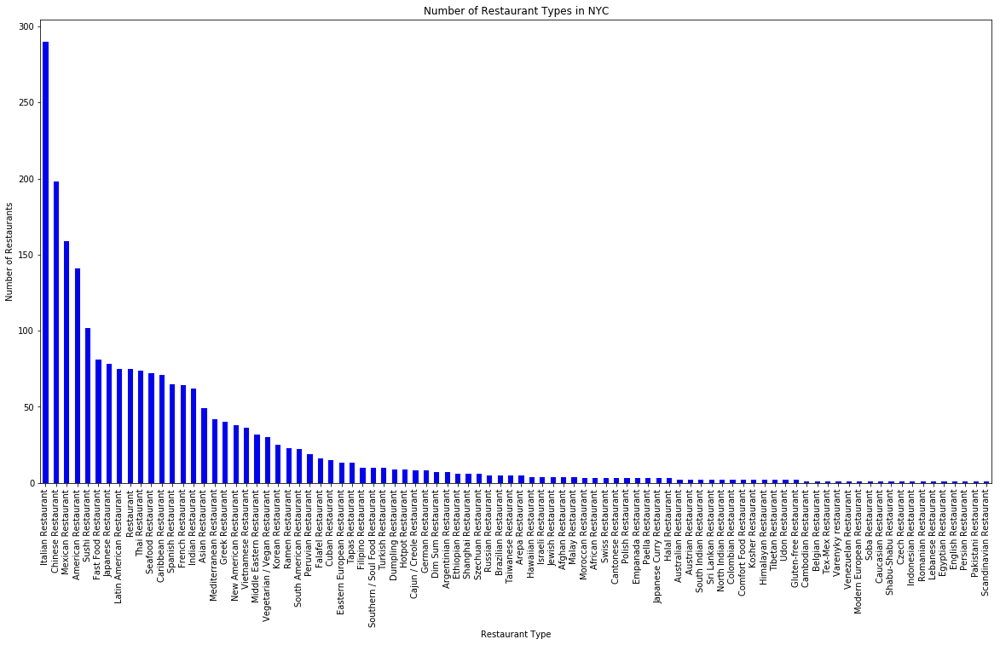

In [45]:
ny_rest_sorted.plot(kind = 'bar', color='blue', figsize=(20,10))

plt.title('Number of Restaurant Types in NYC')
plt.ylabel('Number of Restaurants')
plt.xlabel('Restaurant Type')

plt.show()

We will now combine the neighborhoods to community districts.

In [46]:
ny_rest_hood = newyork_onehot.groupby('Neighborhood').sum()

In [47]:
ny_rest_hood['Restaurants'] = ny_rest_hood.sum(axis=1)

In [48]:
print(ny_rest_hood.shape)
ny_rest_hood.head()

(225, 91)


,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Belgian Restaurant,Brazilian Restaurant,...,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants
Neighborhood,,,,,,,,,,,,,,,,,,,,,
Allerton,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
Annadale,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
Arlington,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
Arrochar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
Arverne,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1


In [65]:
ny_data = pd.merge(neighborhoods_CB, ny_rest_hood, on=['Neighborhood'], how='inner')

In [66]:
ny_data.head()

,Borough,CB,Neighborhood,Latitude,Longitude,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants
0,Bronx,Bronx CB 1,Melrose,40.819754,-73.909422,201,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,Bronx,Bronx CB 1,Mott Haven,40.806239,-73.916100,201,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
2,Bronx,Bronx CB 1,Port Morris,40.801664,-73.913221,201,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
3,Bronx,Bronx CB 10,City Island,40.847247,-73.786488,210,0,0,1,0,...,0,0,0,0,0,0,0,0,0,6
4,Bronx,Bronx CB 10,Co-op City,40.874294,-73.829939,210,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2


In [51]:
ny_data_count = ny_data.groupby('CB').sum()
ny_data_count.drop(columns = {'Latitude', 'Longitude'}, inplace=True)

In [52]:
ny_data_count.head()

,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Belgian Restaurant,Brazilian Restaurant,...,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants
CB,,,,,,,,,,,,,,,,,,,,,
Bronx CB 1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10
Bronx CB 10,0,0,3,0,0,3,0,0,0,0,...,0,1,0,0,0,0,0,0,0,31
Bronx CB 11,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,24
Bronx CB 12,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,18
Bronx CB 2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5


Now I combine the CBs with the restaurant types in the area.

In [53]:
nyc_data = pd.merge(df_CB, ny_data_count, on=['CB'], how='inner')
nyc_data.head()

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants
0,Bronx CB 1,7.17,"91,497","12,761","Melrose, Mott Haven, Port Morris",201,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10
1,Bronx CB 2,5.54,"52,246","9,792","Hunts Point, Longwood",202,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
2,Bronx CB 3,4.07,"79,762","19,598","Claremont, Concourse Village, Crotona Park, Mo...",203,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
3,Bronx CB 4,5.28,"146,441","27,735","Concourse, High Bridge",204,0,0,0,0,...,0,0,0,0,0,0,0,0,0,11
4,Bronx CB 5,3.55,"128,200","36,145","Fordham, Morris Heights, Mount Hope, Universit...",205,0,2,0,0,...,0,0,0,0,0,0,0,0,0,23


In [54]:
# convert columns to integer
area = nyc_data['CB_Area'].str.replace(',', '')
area = pd.to_numeric(area)
nyc_data['CB_Area'] = area
pop = nyc_data['CB_Population'].str.replace(',', '')
pop = pd.to_numeric(pop)
nyc_data['CB_Population'] = pop
skm = nyc_data['CB_Pop_skm'].str.replace(',', '')
skm = pd.to_numeric(skm)
nyc_data['CB_Pop_skm'] = skm
nyc_data.head()

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants
0,Bronx CB 1,7.17,91497,12761,"Melrose, Mott Haven, Port Morris",201,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10
1,Bronx CB 2,5.54,52246,9792,"Hunts Point, Longwood",202,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
2,Bronx CB 3,4.07,79762,19598,"Claremont, Concourse Village, Crotona Park, Mo...",203,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
3,Bronx CB 4,5.28,146441,27735,"Concourse, High Bridge",204,0,0,0,0,...,0,0,0,0,0,0,0,0,0,11
4,Bronx CB 5,3.55,128200,36145,"Fordham, Morris Heights, Mount Hope, Universit...",205,0,2,0,0,...,0,0,0,0,0,0,0,0,0,23


In [68]:
# tmp - save/restore
nyc_data.to_csv('190309_nyc_data.csv')

## Methodology <a name="methodology"></a>

Now we have all necessary data collected.

Now we will analyse in which community districts the most restaurants are.

Then how the types of restaurants are distributed.
Finally we will analyse how many residents per community district are available.


## Analysis <a name="analysis"></a>

### Community Districts with the most Restaurants

Let's perform some basic explanatory data analysis and derive some additional info from our raw data. First let's count the number of restaurants in every area candidate:

In [85]:
rest = nyc_data[['CB', 'Restaurants']]
rest_sorted = rest.sort_values(rest.columns[1], ascending=False)
rest_sorted.set_index('CB', inplace=True)
rest_sorted.head(10)

,Restaurants
CB,
Manhattan CB 2,215
Manhattan CB 6,166
Brooklyn CB 2,129
Queens CB 1,102
Brooklyn CB 6,96
Manhattan CB 8,85
Staten Island CB 2,80
Manhattan CB 7,74
Staten Island CB 1,66


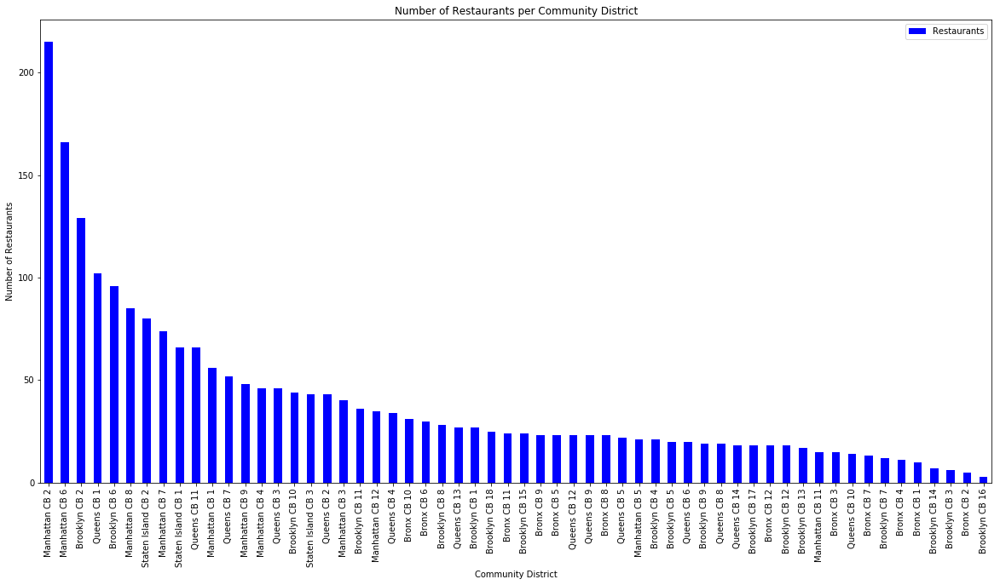

In [89]:
rest_sorted.plot(kind = 'bar', color='blue', figsize=(20,10))

plt.title('Number of Restaurants per Community District')
plt.ylabel('Number of Restaurants')
plt.xlabel('Community District')

plt.show()

Let's crete a map showing heatmap / density of restaurants and try to extract some meaningfull info from that. Also, let's show borders of Community Boards on our map.

In [216]:
rest2 = nyc_data[['boro_cd', 'Restaurants']]
rest2_sorted = rest2.sort_values(rest2.columns[1], ascending=False)
rest2_sorted.set_index('boro_cd', inplace=True)

In [217]:
# New York City latitude and longitude values
latitude = 40.7308619 
longitude = -73.9871558

#
nycb_geo = r'Community Districts.geojson' # geojson file

# create a plain world map
nyc_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# generate choropleth map using the number of crimes of each district 2016
nyc_map.choropleth(
    geo_data=nycb_geo,
    data=rest2,
    columns=['boro_cd', 'Restaurants'],
    key_on='feature.properties.boro_cd',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Restaurants per Community District',
    highlight=True
)

# display map
nyc_map

Looks like a few pockets of low restaurant density closest to city center can be found south, south-east and east from Alexanderplatz.

Let's create another heatmap map showing heatmap/density of Italian restaurants only.


First, we list the 20 community districts with the most Italian restaurants.

In [94]:
rest3 = nyc_data[['CB', 'Italian Restaurant']]
rest3_sorted = rest3.sort_values(rest3.columns[1], ascending=False).head(20)
rest3_sorted.set_index('CB', inplace=True)
rest3_sorted.head(10)

,Italian Restaurant
CB,
Manhattan CB 2,33
Brooklyn CB 6,22
Manhattan CB 8,22
Staten Island CB 2,21
Bronx CB 6,19
Manhattan CB 6,19
Brooklyn CB 2,17
Staten Island CB 1,15
Manhattan CB 1,12


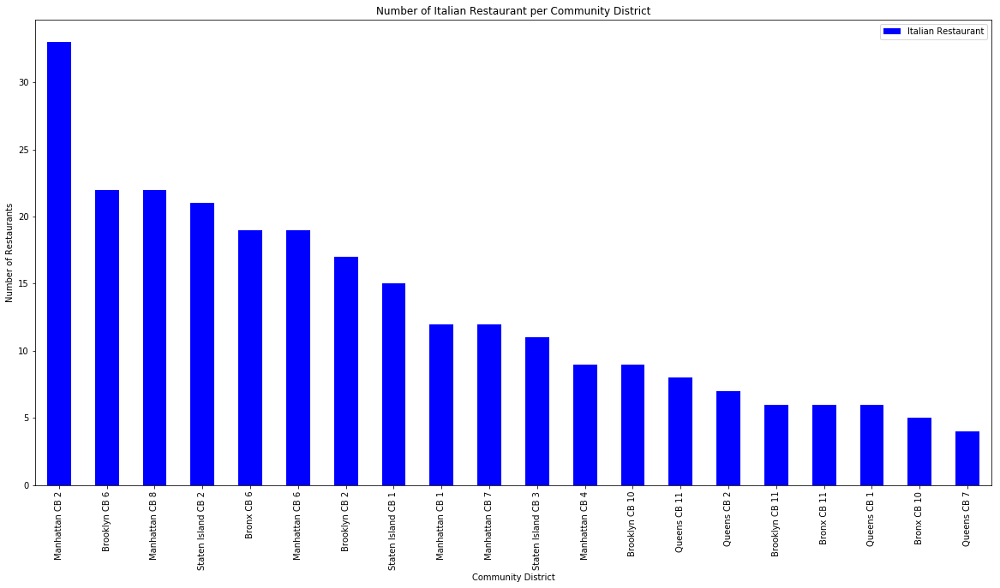

In [95]:
rest3_sorted.plot(kind = 'bar', color='blue', figsize=(20,10))

plt.title('Number of Italian Restaurant per Community District')
plt.ylabel('Number of Restaurants')
plt.xlabel('Community District')

plt.show()

In [218]:
rest3 = nyc_data[['boro_cd', 'Italian Restaurant']]
rest3_sorted = rest3.sort_values(rest3.columns[1], ascending=False)
rest3_sorted.set_index('boro_cd', inplace=True)

In [219]:
# New York City latitude and longitude values
latitude = 40.7308619 
longitude = -73.9871558

#
nycb_geo = r'Community Districts.geojson' # geojson file

# create a plain world map
nyc_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# generate choropleth map using the number of crimes of each district 2016
nyc_map.choropleth(
    geo_data=nycb_geo,
    data=rest3,
    columns=['boro_cd', 'Italian Restaurant'],
    key_on='feature.properties.boro_cd',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Italian Restaurants per Community District',
    highlight=True
)

# display map
nyc_map

These maps give roughly the same impression, that the boroughs of Southern Manhattan, Staten Island and Western Brooklyn and Queens. This is propably because a lot of people work in these areas and stay for dinner in these CB's. 

Let's take a look in the number of restaurants per resident.

In [98]:
# residents per skm per community board
df_pop_CB = nyc_data[['CB', 'CB_Pop_skm']]
df_pop_CB_sorted = df_pop_CB.sort_values(df_pop_CB.columns[1], ascending=False).head(20)
df_pop_CB_sorted.set_index('CB', inplace=True)
df_pop_CB_sorted.head(20)


,CB_Pop_skm
CB,
Manhattan CB 8,42312
Manhattan CB 6,38353
Manhattan CB 7,38040
Bronx CB 5,36145
Manhattan CB 3,36054
Bronx CB 7,28778
Manhattan CB 9,28574
Bronx CB 4,27735
Manhattan CB 12,27279


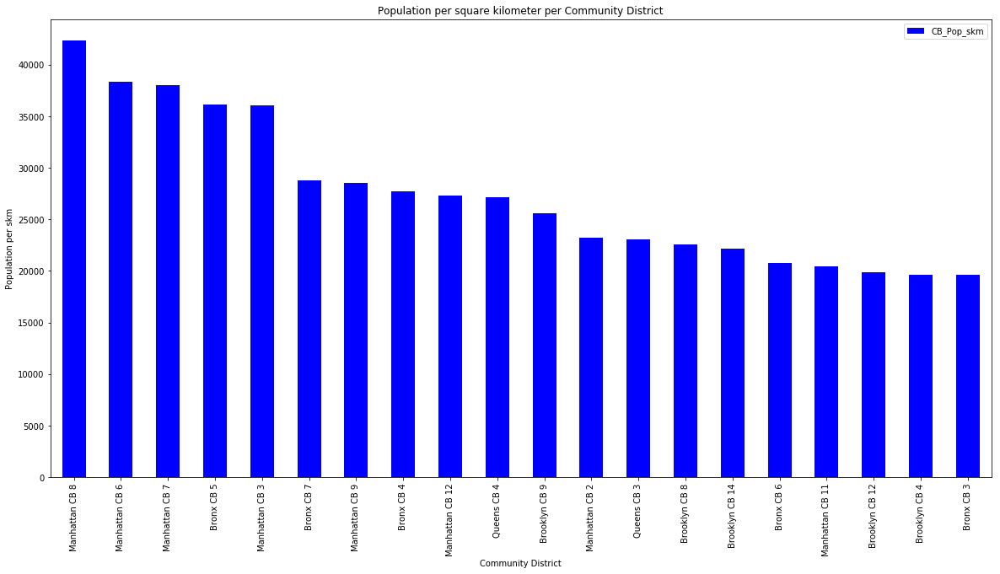

In [99]:
df_pop_CB_sorted.plot(kind = 'bar', color='blue', figsize=(20,10))

plt.title('Population per square kilometer per Community District')
plt.ylabel('Population per skm')
plt.xlabel('Community District')

plt.show()

In [220]:
df_pop = nyc_data[['boro_cd', 'CB_Pop_skm']]

In [221]:
# New York City latitude and longitude values
latitude = 40.7308619 
longitude = -73.9871558

#
nycb_geo = r'Community Districts.geojson' # geojson file

# create a plain world map
nyc_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# generate choropleth map using the number of crimes of each district 2016
nyc_map.choropleth(
    geo_data=nycb_geo,
    data=df_pop,
    columns=['boro_cd', 'CB_Pop_skm'],
    key_on='feature.properties.boro_cd',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Popoulation Density per Community District'
)

# display map
nyc_map

### Final analysis

Now we have a few criteria that we can combine: to determine where to open an italian restaurant:

What are the most common restaurant types in each CD?

Max number residents per square kilometer per Community Districts

Max number of restaurants in the CD

Min number of Italian Restaurants in the CD

### Determine the most common restaurant types per district

In [90]:
ny_rest = ny_data.copy()
ny_rest.drop(['Restaurants', ], axis=1, inplace=True)
ny_rest.drop(['Latitude', 'Longitude'], axis=1, inplace=True)
ny_rest_means = ny_rest.groupby('CB').mean().reset_index()

In [93]:
ny_rest_means.head()

,CB,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Belgian Restaurant,...,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Varenyky restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant
0,Bronx CB 1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Bronx CB 10,0.0,0.0,0.500000,0.000000,0.0,0.5,0.0,0.0,0.0,...,0.0,0.0,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Bronx CB 11,0.0,0.0,0.166667,0.166667,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Bronx CB 12,0.0,0.0,0.333333,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Bronx CB 2,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [94]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [180]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['CB']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
CB_venues_sorted = pd.DataFrame(columns=columns)
CB_venues_sorted['CB'] = ny_rest_means['CB']
for ind in np.arange(ny_rest_means.shape[0]):
    CB_venues_sorted.iloc[ind, 1:] = return_most_common_venues(ny_rest_means.iloc[ind, :], num_top_venues)

CB_venues_sorted.head()

,CB,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bronx CB 1,Latin American Restaurant,Spanish Restaurant,Peruvian Restaurant,Restaurant,Mexican Restaurant
1,Bronx CB 10,Chinese Restaurant,Italian Restaurant,Fast Food Restaurant,American Restaurant,Asian Restaurant
2,Bronx CB 11,Italian Restaurant,Spanish Restaurant,Chinese Restaurant,Mexican Restaurant,Sushi Restaurant
3,Bronx CB 12,Caribbean Restaurant,Fast Food Restaurant,American Restaurant,Italian Restaurant,Seafood Restaurant
4,Bronx CB 2,Restaurant,Seafood Restaurant,Latin American Restaurant,Fast Food Restaurant,Spanish Restaurant


### Cluster Districts

In [181]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

# set number of clusters
kclusters = 3

ny_rest_grouped_clustering = ny_rest_means.drop('CB', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(ny_rest_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_ 

array([2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 2, 0, 2, 1, 2, 0, 2, 1, 0, 0, 1, 0, 1, 2, 1, 1, 1, 0, 2, 2, 2,
       2, 2, 2, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)

In [209]:
# add clustering labels
CB_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

nyc_merged = nyc_data
# merge nyc_merged with CB_venues_sorted to add cluster labels for each district
CB_all_merged = nyc_merged.join(CB_venues_sorted.set_index('CB'), on='CB')

CB_all_merged.head(10) # check the last columns!

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bronx CB 1,7.17,91497,12761,"Melrose, Mott Haven, Port Morris",201,0,0,0,0,...,0,0,0,10,2,Latin American Restaurant,Spanish Restaurant,Peruvian Restaurant,Restaurant,Mexican Restaurant
1,Bronx CB 2,5.54,52246,9792,"Hunts Point, Longwood",202,0,0,0,0,...,0,0,0,5,2,Restaurant,Seafood Restaurant,Latin American Restaurant,Fast Food Restaurant,Spanish Restaurant
2,Bronx CB 3,4.07,79762,19598,"Claremont, Concourse Village, Crotona Park, Mo...",203,0,0,0,0,...,0,0,0,15,2,Fast Food Restaurant,Mexican Restaurant,Chinese Restaurant,Italian Restaurant,Indian Restaurant
3,Bronx CB 4,5.28,146441,27735,"Concourse, High Bridge",204,0,0,0,0,...,0,0,0,11,2,Chinese Restaurant,Italian Restaurant,Caribbean Restaurant,Seafood Restaurant,Latin American Restaurant
4,Bronx CB 5,3.55,128200,36145,"Fordham, Morris Heights, Mount Hope, Universit...",205,0,2,0,0,...,0,0,0,23,2,Fast Food Restaurant,Spanish Restaurant,Latin American Restaurant,Chinese Restaurant,African Restaurant
5,Bronx CB 6,4.01,83268,20765,"Bathgate, Belmont, East Tremont, West Farms",206,0,0,1,0,...,0,0,0,30,1,Italian Restaurant,Mexican Restaurant,Mediterranean Restaurant,Spanish Restaurant,Japanese Restaurant
6,Bronx CB 7,4.84,139286,28778,"Bedford Park, Norwood, University Heights",207,0,0,1,0,...,0,0,0,13,2,Mexican Restaurant,Chinese Restaurant,Spanish Restaurant,Restaurant,Caribbean Restaurant
7,Bronx CB 8,8.83,101731,11521,"Fieldston, Kingsbridge, Kingsbridge Heights, M...",208,0,0,1,0,...,0,0,1,23,2,Mexican Restaurant,Latin American Restaurant,Spanish Restaurant,Seafood Restaurant,Chinese Restaurant
8,Bronx CB 9,12.41,172298,13884,"Bronx River, Bruckner, Castle Hill, Clason Poi...",209,0,0,2,0,...,0,0,0,23,2,Latin American Restaurant,Chinese Restaurant,Asian Restaurant,Spanish Restaurant,Caribbean Restaurant
9,Bronx CB 10,16.76,120392,7183,"City Island, Co-op City, Locust Point, Pelham ...",210,0,0,3,0,...,0,0,0,31,2,Chinese Restaurant,Italian Restaurant,Fast Food Restaurant,American Restaurant,Asian Restaurant


Now let's visualize the cluster per diostrict on a chloropeth map

In [185]:
# New York City latitude and longitude values
latitude = 40.7308619 
longitude = -73.9871558

#
nycb_geo = r'Community Districts.geojson' # geojson file

# create a plain world map
nyc_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# generate choropleth map using the number of crimes of each district 2016
nyc_map.choropleth(
    geo_data=nycb_geo,
    data=CB_merged,
    columns=['boro_cd', 'Cluster Labels'],
    key_on='feature.properties.boro_cd',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    threshold_scale=[0, 1, 2, 3],
    legend_name='Community District Cluster',
)

# display map
nyc_map

In [207]:
CB_merged.groupby(['Cluster Labels']).count()

,CB,boro_cd,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
Cluster Labels,,,,,,,
0,8,8,8,8,8,8,8
1,11,11,11,11,11,11,11
2,39,39,39,39,39,39,39


### Cluster 0  - Very dense population, Latin American and Chinese Restaurants
    
This cluster contains 8 Community Districts, which have a very high population per skm ratio and a predominantly Mexican, Latrin American and Chinese Restaurant present.

In [210]:
CB_all_merged.loc[CB_merged['Cluster Labels'] == 0]

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
15,Brooklyn CB 4,5.31,104358,19653,Bushwick,304,0,0,1,0,...,1,0,0,21,0,Mexican Restaurant,Chinese Restaurant,New American Restaurant,Italian Restaurant,American Restaurant
19,Brooklyn CB 8,4.25,96076,22606,"Crown Heights, Prospect Heights, Weeksville",308,0,0,2,0,...,1,0,1,28,0,Thai Restaurant,Mexican Restaurant,Chinese Restaurant,New American Restaurant,American Restaurant
32,Manhattan CB 3,4.56,164407,36054,"Alphabet City, Chinatown, East Village, Lower ...",103,0,0,2,2,...,2,0,2,40,0,Mexican Restaurant,Ramen Restaurant,Chinese Restaurant,Japanese Restaurant,Vietnamese Restaurant
38,Manhattan CB 9,3.91,111724,28574,"Hamilton Heights, Manhattanville, Morningside ...",109,0,0,4,0,...,0,0,0,48,0,Mexican Restaurant,Chinese Restaurant,American Restaurant,Indian Restaurant,Seafood Restaurant
39,Manhattan CB 11,5.75,117743,20477,"East Harlem, Randall’s Island, Spanish Harlem,...",111,0,0,0,0,...,0,0,0,15,0,Mexican Restaurant,Latin American Restaurant,Thai Restaurant,Seafood Restaurant,Cuban Restaurant
40,Manhattan CB 12,7.64,208414,27279,"Inwood, Washington Heights",112,0,0,2,1,...,0,0,0,35,0,Mexican Restaurant,Chinese Restaurant,Latin American Restaurant,Spanish Restaurant,Restaurant
43,Queens CB 3,7.33,169083,23067,"East Elmhurst, Jackson Heights, North Corona",403,0,0,1,0,...,0,0,0,46,0,Latin American Restaurant,South American Restaurant,Peruvian Restaurant,Mexican Restaurant,Spanish Restaurant
44,Queens CB 4,6.16,167005,27111,"Corona, Elmhurst",404,0,0,0,0,...,0,0,2,34,0,Mexican Restaurant,Thai Restaurant,Chinese Restaurant,South American Restaurant,Restaurant


### Cluster 1  
    
This cluster contains 11 Community Districts, which have a mixed number of population per skm and many restaurants. These are predominantly Italian ans American Restaurants.

In [212]:
CB_all_merged.loc[CB_merged['Cluster Labels'] == 1]

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
5,Bronx CB 6,4.01,83268,20765,"Bathgate, Belmont, East Tremont, West Farms",206,0,0,1,0,...,0,0,0,30,1,Italian Restaurant,Mexican Restaurant,Mediterranean Restaurant,Spanish Restaurant,Japanese Restaurant
13,Brooklyn CB 2,7.72,98620,12775,"Boerum Hill, Brooklyn Heights, Brooklyn Navy Y...",302,0,0,13,0,...,2,0,3,129,1,Italian Restaurant,American Restaurant,Mexican Restaurant,Indian Restaurant,Japanese Restaurant
17,Brooklyn CB 6,9.01,104054,11549,"Carroll Gardens, Cobble Hill, Gowanus, Park Sl...",306,0,0,10,0,...,1,0,1,96,1,Italian Restaurant,American Restaurant,Seafood Restaurant,Thai Restaurant,Mexican Restaurant
21,Brooklyn CB 10,10.57,122542,11593,"Bay Ridge, Dyker Heights, Fort Hamilton",310,0,0,4,0,...,0,0,1,44,1,Italian Restaurant,Chinese Restaurant,American Restaurant,Greek Restaurant,Sushi Restaurant
30,Manhattan CB 1,4.45,34420,7735,"Battery Park City, Financial District, TriBeCa",101,0,0,8,0,...,2,0,1,56,1,Italian Restaurant,American Restaurant,Greek Restaurant,Seafood Restaurant,Chinese Restaurant
31,Manhattan CB 2,4.01,93119,23222,"Chinatown, Greenwich Village, Little Italy, Lo...",102,0,0,16,0,...,4,1,8,215,1,Italian Restaurant,Chinese Restaurant,French Restaurant,American Restaurant,Seafood Restaurant
33,Manhattan CB 4,5.41,87479,16170,"Chelsea, Clinton",104,0,0,8,0,...,2,0,0,46,1,Italian Restaurant,American Restaurant,Seafood Restaurant,French Restaurant,New American Restaurant
35,Manhattan CB 6,3.55,136152,38353,"Gramercy Park, Kips Bay, Murray Hill, Peter Co...",106,0,0,12,0,...,2,0,4,166,1,Italian Restaurant,Sushi Restaurant,American Restaurant,Mexican Restaurant,Restaurant
36,Manhattan CB 7,5.46,207699,38040,"Lincoln Square, Manhattan Valley, Upper West Side",107,0,0,4,0,...,3,0,1,74,1,Italian Restaurant,French Restaurant,Mediterranean Restaurant,Chinese Restaurant,Indian Restaurant
37,Manhattan CB 8,5.13,217063,42312,"Lenox Hill, Roosevelt Island, Upper East Side,...",108,1,0,2,0,...,3,0,2,85,1,Italian Restaurant,Sushi Restaurant,Japanese Restaurant,Mexican Restaurant,French Restaurant


### Cluster 2  
    
This cluster contains with 39 Community Districts the majorioty of NYC Community Districts. , which have a low to medium number of population per skm and mixed number of restaurants. The types of restaurants are generally different and no general structure can be determined. 

In [213]:
CB_all_merged.loc[CB_merged['Cluster Labels'] == 2]

,CB,CB_Area,CB_Population,CB_Pop_skm,Neighborhoods,boro_cd,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,...,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Restaurants,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bronx CB 1,7.17,91497,12761,"Melrose, Mott Haven, Port Morris",201,0,0,0,0,...,0,0,0,10,2,Latin American Restaurant,Spanish Restaurant,Peruvian Restaurant,Restaurant,Mexican Restaurant
1,Bronx CB 2,5.54,52246,9792,"Hunts Point, Longwood",202,0,0,0,0,...,0,0,0,5,2,Restaurant,Seafood Restaurant,Latin American Restaurant,Fast Food Restaurant,Spanish Restaurant
2,Bronx CB 3,4.07,79762,19598,"Claremont, Concourse Village, Crotona Park, Mo...",203,0,0,0,0,...,0,0,0,15,2,Fast Food Restaurant,Mexican Restaurant,Chinese Restaurant,Italian Restaurant,Indian Restaurant
3,Bronx CB 4,5.28,146441,27735,"Concourse, High Bridge",204,0,0,0,0,...,0,0,0,11,2,Chinese Restaurant,Italian Restaurant,Caribbean Restaurant,Seafood Restaurant,Latin American Restaurant
4,Bronx CB 5,3.55,128200,36145,"Fordham, Morris Heights, Mount Hope, Universit...",205,0,2,0,0,...,0,0,0,23,2,Fast Food Restaurant,Spanish Restaurant,Latin American Restaurant,Chinese Restaurant,African Restaurant
6,Bronx CB 7,4.84,139286,28778,"Bedford Park, Norwood, University Heights",207,0,0,1,0,...,0,0,0,13,2,Mexican Restaurant,Chinese Restaurant,Spanish Restaurant,Restaurant,Caribbean Restaurant
7,Bronx CB 8,8.83,101731,11521,"Fieldston, Kingsbridge, Kingsbridge Heights, M...",208,0,0,1,0,...,0,0,1,23,2,Mexican Restaurant,Latin American Restaurant,Spanish Restaurant,Seafood Restaurant,Chinese Restaurant
8,Bronx CB 9,12.41,172298,13884,"Bronx River, Bruckner, Castle Hill, Clason Poi...",209,0,0,2,0,...,0,0,0,23,2,Latin American Restaurant,Chinese Restaurant,Asian Restaurant,Spanish Restaurant,Caribbean Restaurant
9,Bronx CB 10,16.76,120392,7183,"City Island, Co-op City, Locust Point, Pelham ...",210,0,0,3,0,...,0,0,0,31,2,Chinese Restaurant,Italian Restaurant,Fast Food Restaurant,American Restaurant,Asian Restaurant
10,Bronx CB 11,9.32,113232,12149,"Allerton, Bronxdale, Indian Village, Laconia, ...",211,0,0,1,1,...,0,0,0,24,2,Italian Restaurant,Spanish Restaurant,Chinese Restaurant,Mexican Restaurant,Sushi Restaurant


From all the above analysed, it can be seen that if the restaurant shall be opened with a lot of other restaurants and public, it should be looked at cluster number 0 or 1.

If a restaurant might not be suitable for a lot of competition, it should be looked at cluster number 2.

This concludes our analysis. Although the analysis gives an overview on Community districts, this should be considered only as a starting point for exploring area neighborhoods in search for potential restaurant locations. 

## Results and Discussion <a name="results"></a>

Our analysis shows that although there is a great number of restaurants in New York City (~2300 in all Boroughs), there are pockets of lower restaurant density. The Highest concentration of restaurants was detected in Mahattan and in Brooklyn and Queens closer to the East River/ Manhattan. 


## Conclusion <a name="conclusion"></a>

Purpose of this project was to identify New York City Community Districts, that with lower number of restaurants (particularly Italian restaurants) in order to aid stakeholders in narrowing down the search for optimal location for a new restaurant. By calculating restaurant density distribution from Foursquare data we have identified districts with high, medium and lower number of restaurants. Clustering of those locations was then performed in order to create more information on community district restaurant information to be used as starting points for final exploration by stakeholders.

Final decission on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.